Analiza obrazu - detekcja twarzy  
Szymon Dyszewski 310625  
Grupa 107

# Analiza obrazu - detekcja twarzy

In [ ]:
# -*- coding: utf-8 -*-


import cv2
from google.colab.patches import cv2_imshow
import dlib
import time 


# Obraz testowy

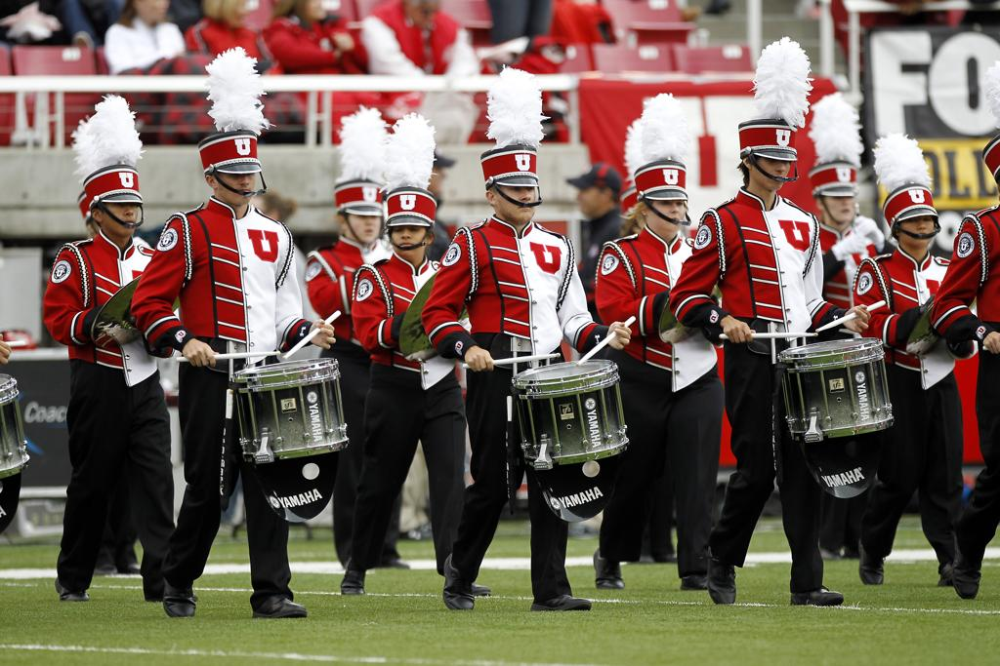

In [ ]:
img = cv2.imread("/10_People_Marching_People_Marching_2_60.jpg")
cv2_imshow(img)

# Kaskada Haara

Ilość rozpoznanych twarzy: 6
Czas wykonania: 1.0111424780006928


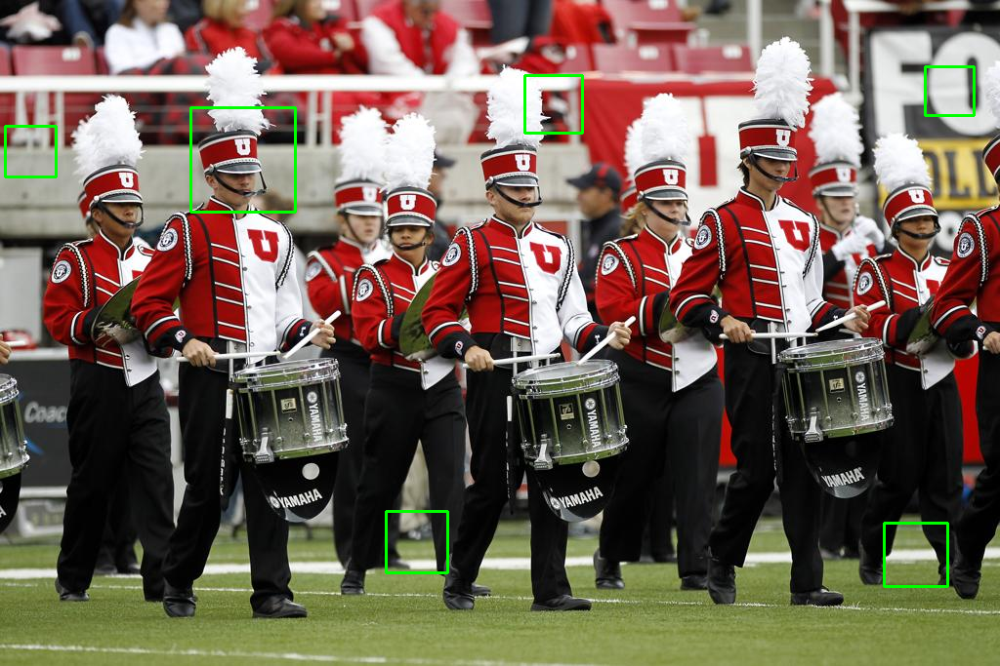

In [ ]:
def HAAR(img):
	haar_detector = cv2.CascadeClassifier("/haarcascade_frontalface_default.xml")
	gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

	start = time.perf_counter()

	rects = haar_detector.detectMultiScale(gray, scaleFactor=1.05,
																		minNeighbors=5, minSize=(30, 30),
																		flags=cv2.CASCADE_SCALE_IMAGE)
	end = time.perf_counter()

	img_haar = img.copy()
	for (x, y, w, h) in rects:
		cv2.rectangle(img_haar, (x, y), (x + w, y + h), (0, 255, 0), 2)

	print(f'Ilość rozpoznanych twarzy: {len(rects)}')
	print(f'Czas wykonania: {end - start}')

	cv2_imshow(img_haar)

HAAR(img)

# Histogram zorientowanych gradientów (HOG) z maszyną wektorów nośnych (SVM)

Ilość rozpoznanych twarzy: 0
Czas wykonania: 0.5588149750001321


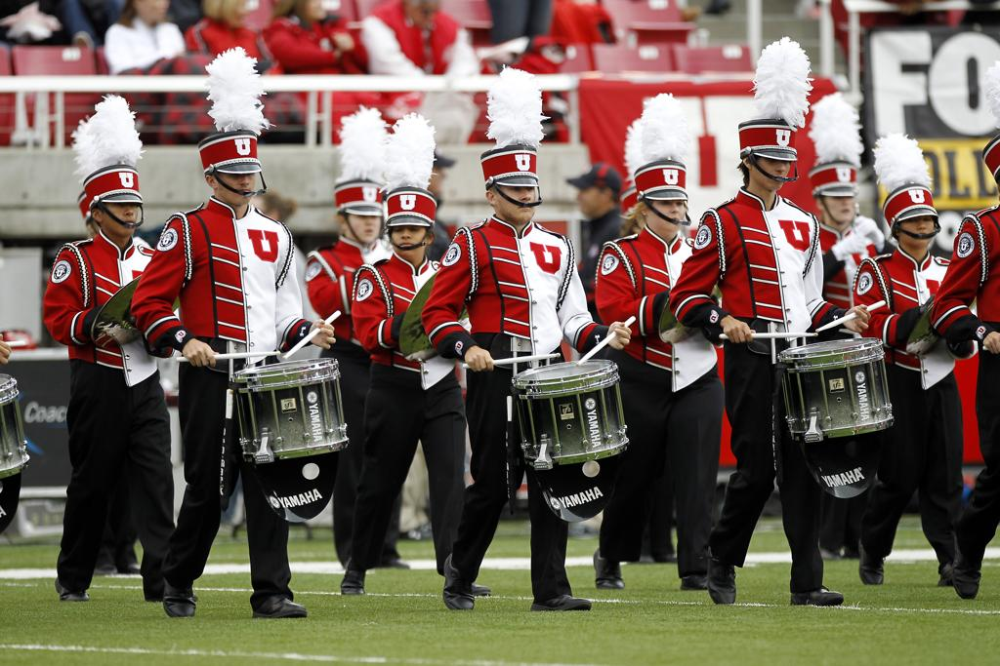

In [ ]:
def convert_and_trim_bb(image, rect):
	# extract the starting and ending (x, y)-coordinates of the
	# bounding box
	startX = rect.left()
	startY = rect.top()
	endX = rect.right()
	endY = rect.bottom()
	# ensure the bounding box coordinates fall within the spatial
	# dimensions of the image
	startX = max(0, startX)
	startY = max(0, startY)
	endX = min(endX, image.shape[1])
	endY = min(endY, image.shape[0])
	# compute the width and height of the bounding box
	w = endX - startX
	h = endY - startY
	# return our bounding box coordinates
	return (startX, startY, w, h)

def HOG(img):
  hog_svm_detector = dlib.get_frontal_face_detector()
  rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  start = time.perf_counter()
  hog_svm_rects = hog_svm_detector(rgb, 1)
  end = time.perf_counter()
  hog_svm_boxes = [convert_and_trim_bb(img, r) for r in hog_svm_rects]

  img_hog_svm = img.copy()
  for (x, y, w, h) in hog_svm_boxes:
    cv2.rectangle(img_hog_svm, (x, y), (x + w, y + h), (0, 255, 0), 2)
  
  print(f'Ilość rozpoznanych twarzy: {len(hog_svm_rects)}')
  print(f'Czas wykonania: {end - start}')

  cv2_imshow(img_hog_svm)
HOG(img)

# Splotowa sieć neuronowa (CNN)

Ilość rozpoznanych twarzy: 1
Czas wykonania: 0.4021492499996384


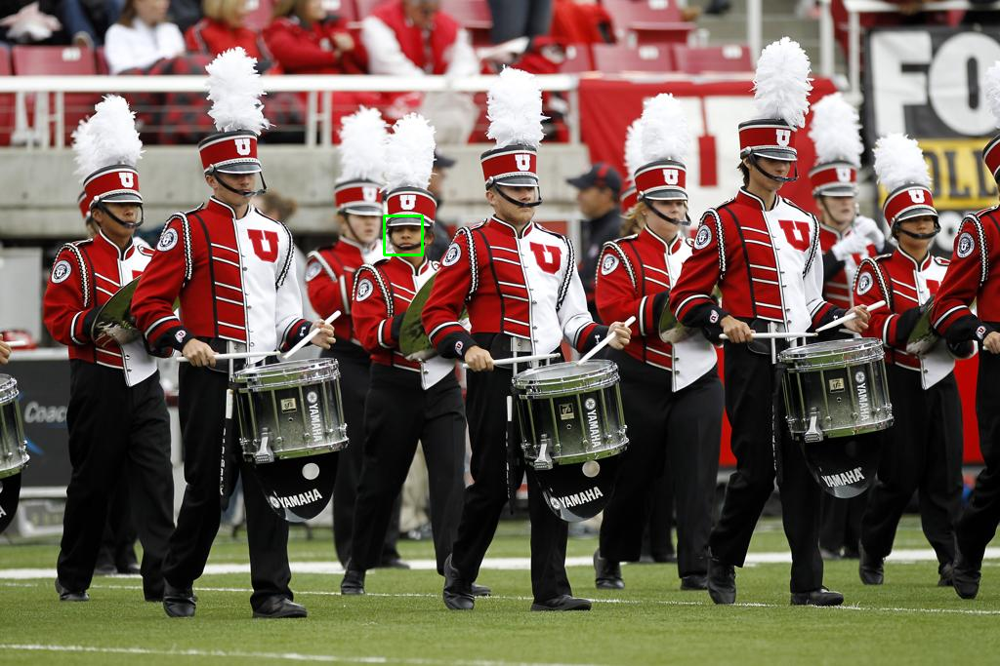

In [ ]:
def CNN(img):
    cnn_detector = dlib.cnn_face_detection_model_v1('/mmod_human_face_detector.dat')
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    start = time.perf_counter()
    cnn_rects = cnn_detector(rgb, 1)
    end = time.perf_counter()

    cnn_boxes = [convert_and_trim_bb(img, r.rect) for r in cnn_rects]

    img_cnn = img.copy()
    for (x, y, w, h) in cnn_boxes:
      cv2.rectangle(img_cnn, (x, y), (x + w, y + h), (0, 255, 0), 2)


    print(f'Ilość rozpoznanych twarzy: {len(cnn_rects)}')
    print(f'Czas wykonania: {end - start}')

    cv2_imshow(img_cnn)

    cv2.waitKey(0)
    cv2.destroyAllWindows()
CNN(img)

# Ground Truth

In [ ]:
TRUTH = {}
TRUTHFACE = {}
with open('/ground_truth_bbx.txt', 'r') as file:
    file_line = file.readline()
    file_line = file.readline()
    file_line = file.readline()
    file_line = file.readline()
    file_line = file.readline()
    file_line = file.readline()
    while True:
        if not file_line:
            break
        if(len(file_line.split('/')) > 1):
            file_name = file_line.split('/')[1]
            file_name = file_name.rstrip()
            file_line = file.readline()
            file_line = file_line.rstrip()
            TRUTHFACE[file_name] = file_line.split(' ')[:1]
            rectangles = []
            while True:
                    file_line = file.readline()
                    file_line = file_line.rstrip()
                    if not file_line or len(file_line.split('/')) > 1:
                        break
                    rectangle = [int(x) for x in file_line.split(' ')[:4]]
                    rectangles.append(rectangle)
            TRUTH[file_name] = rectangles

In [ ]:
def reveal_the_truth(image, file_name):
    boxes = TRUTH[file_name]
    print(f'Rzeczywista ilość twarzy: {int(TRUTHFACE[file_name][0])}')
    for (x, y, w, h) in boxes:
        cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)
    cv2_imshow(image)

Rzeczywista ilość twarzy: 5


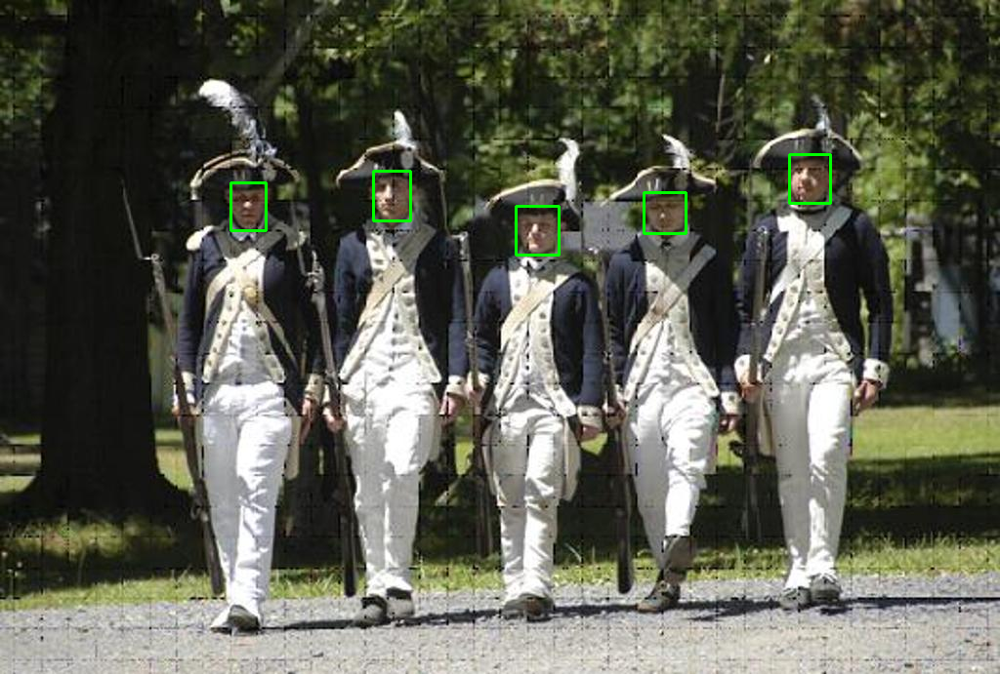

Ilość rozpoznanych twarzy: 12
Czas wykonania: 1.2924967979997746


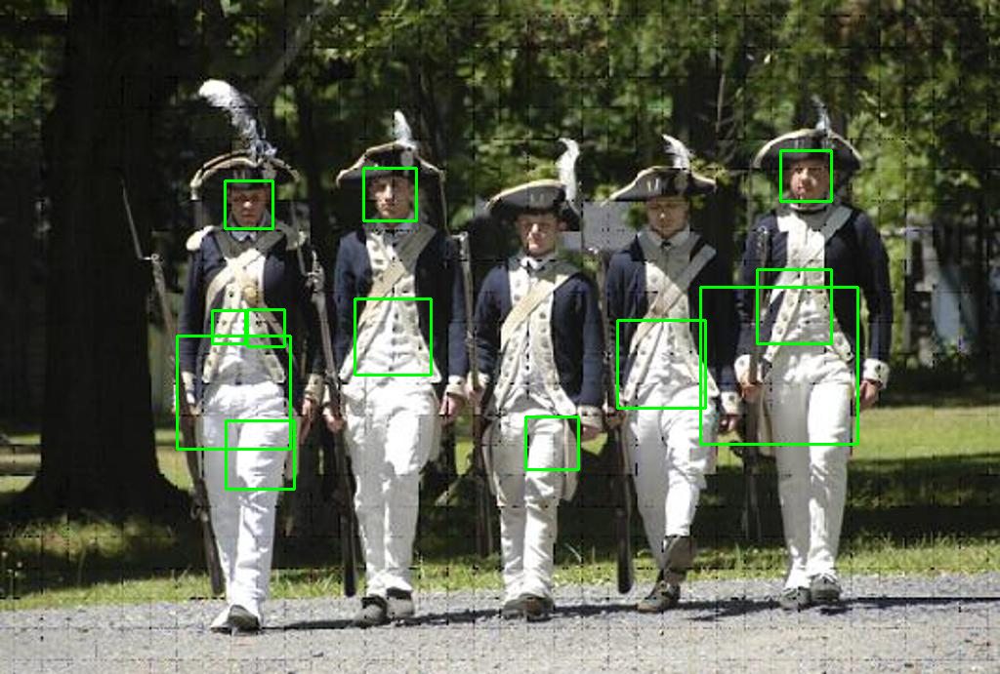

Ilość rozpoznanych twarzy: 1
Czas wykonania: 0.5414981479989365


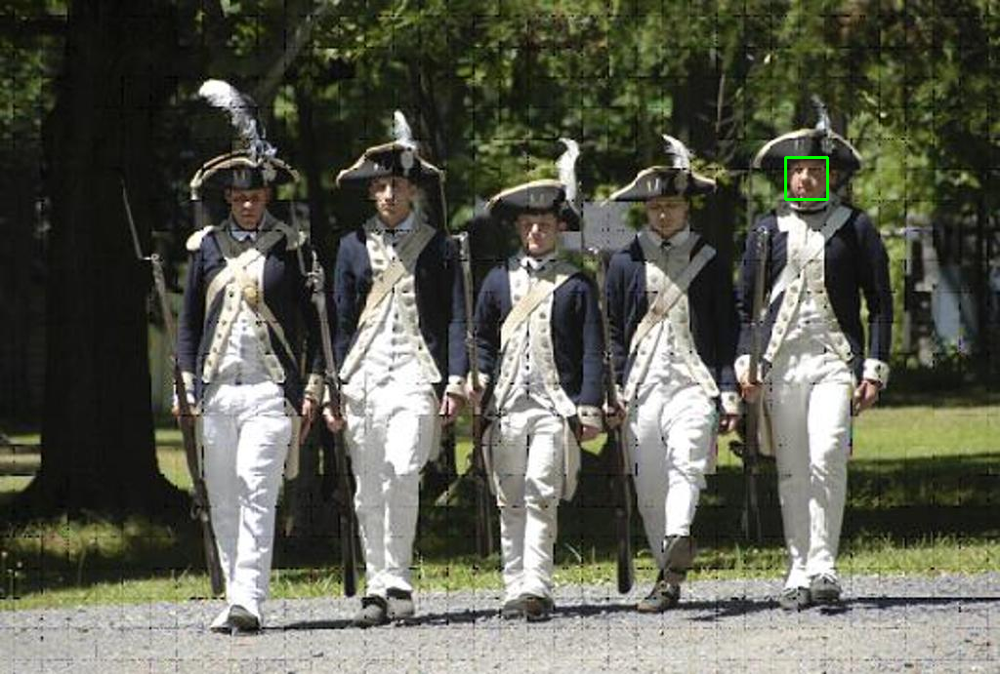

Ilość rozpoznanych twarzy: 4
Czas wykonania: 0.5137005310007225


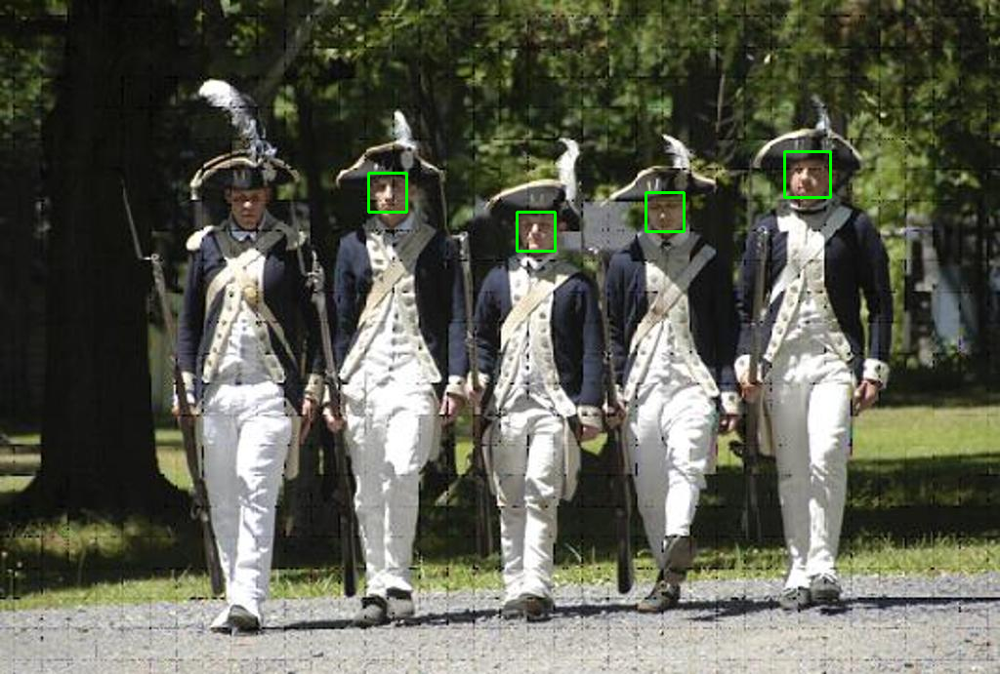

In [ ]:
if __name__ == "__main__":
  img = cv2.imread("/26_Soldier_Drilling_Soldiers_Drilling_26_31.jpg")
  file_name = "26_Soldier_Drilling_Soldiers_Drilling_26_31.jpg"
  reveal_the_truth(img.copy(), file_name)
  HAAR(img)
  HOG(img)
  CNN(img)

# Wnioski

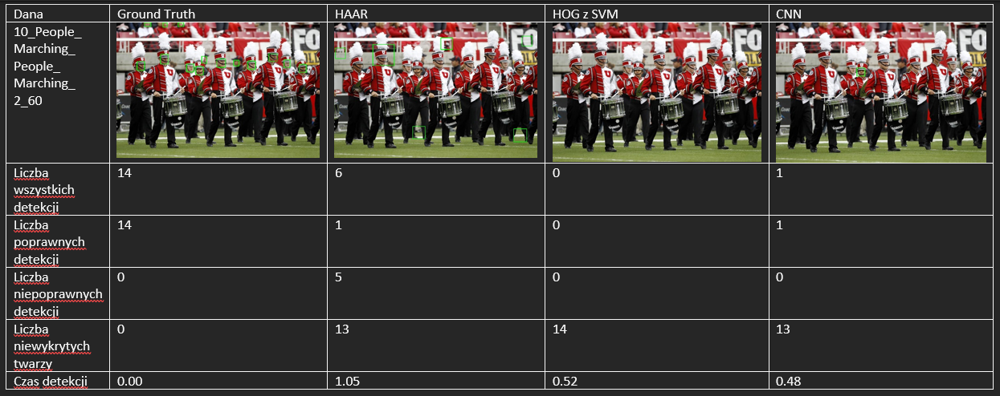

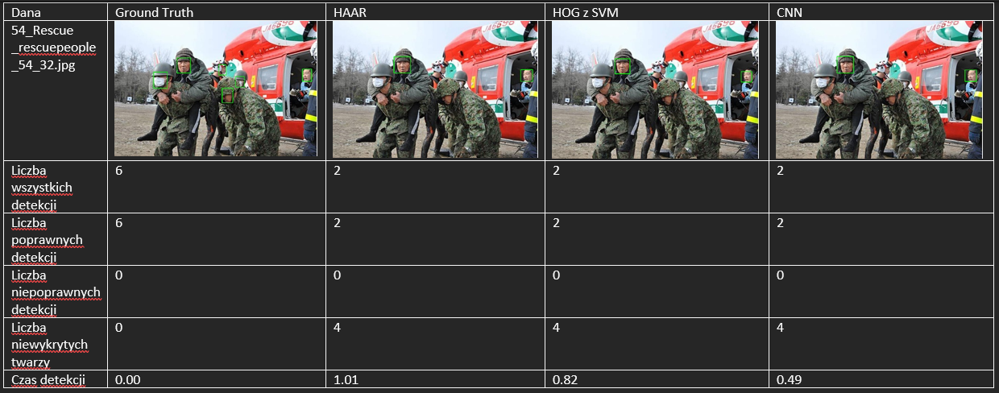

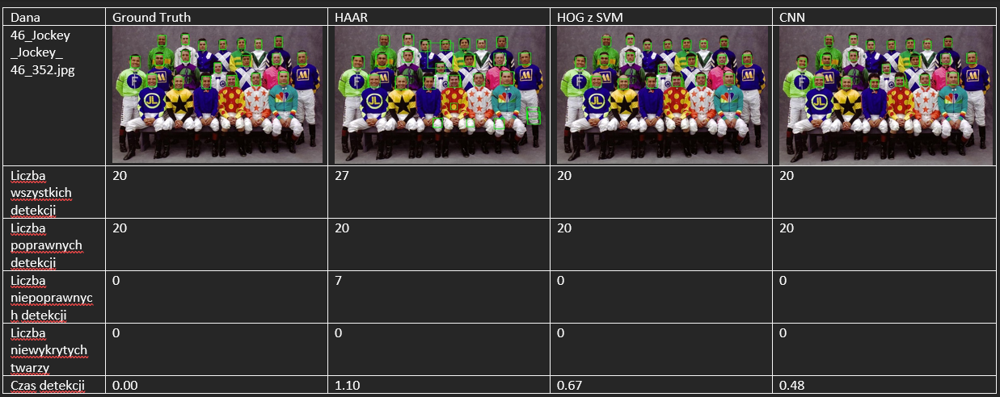

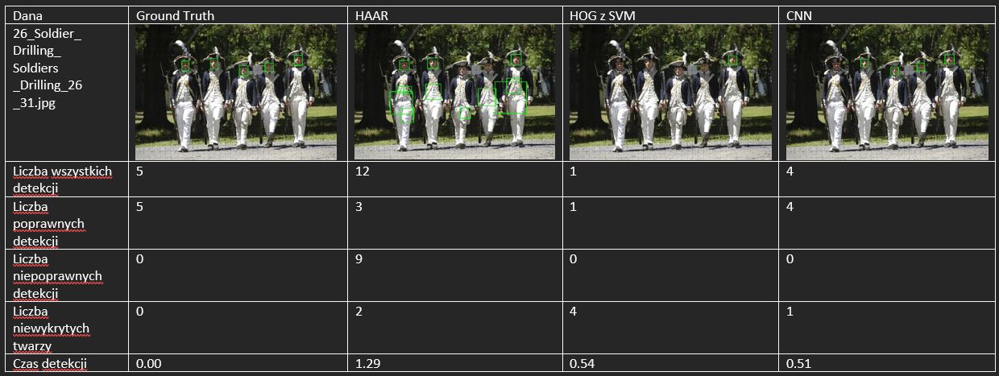

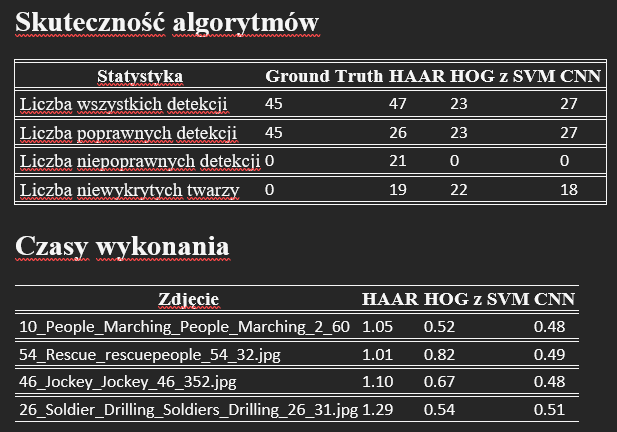

## Kaskada Haara:
Zalety:
-	dużo poprawnie wykrytych twarzy  
Wady:
-	duża liczba niepoprawnych detekcji
-	długi czas działania

## Histogram Zorientowanych Gradientów z Maszyną Wektorów Nośnych jako klasyfikator:  
Zalety:
-	krótki czas działania algorytmu
-	wszystkie oznaczone twarze są poprawne  
Wady:
-	wykrył najmniejszą ilość twarzy

## Splotowa sieć neuronowa (Convlutional Neural Networks)  
Zalety:
-	poradziła sobie najlepiej ze wszystkich dostępnych algorytmów
-	możliwa detekcja twarzy w czasie rzeczywistym
-	wykryła poprawnie największą ilość twarzy
-	wszystkie oznaczone twarze są poprawne  
Wady:
-	do detekcji należy wykorzystać o wiele więcej zasobów 
niż w przypadku poprzednich algorytmów (włączono akcelerację sprzętową GPU)
-	przeciętna skuteczność wykrywania twarzy (60%)
